<a href="https://colab.research.google.com/github/alexswcr/Face-Landmark-Detection-with-CNNs/blob/Add-Files/Task_2_Face_Alignment_Pt_1.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Colab Face Alignment- Using CNNs

**This Task has 3 separate Notebooks, please view them chronologically.**

**Each notebook saves the data or models that were built, meaning that the next notebook can pick up where it left off. Many of the code blocks contain np.load() statements that directly access my google drive and will likely error on different google accounts. The submission folder should contain the saved files and you can change the directory of the np.load to access your respective drive location**

## 1 Loading Data

Saving the images and points to variables

In [ ]:
import numpy as np
!wget "https://sussex.box.com/shared/static/wrlmcs47dstkmfz2eckgg5d2l0liusr5" -O face_alignment_training_images.npz
train_data = np.load('face_alignment_training_images.npz',allow_pickle=True)


train_img = train_data['images']
train_pts = train_data['points']


print(train_img.shape,train_pts.shape)

Visualising points on face

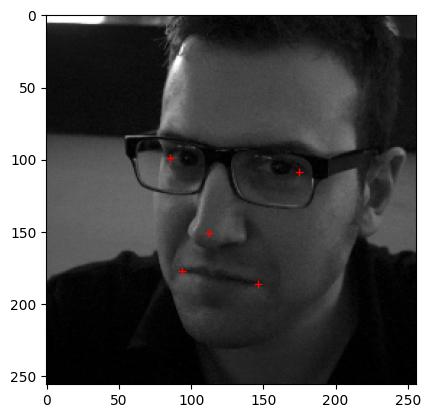

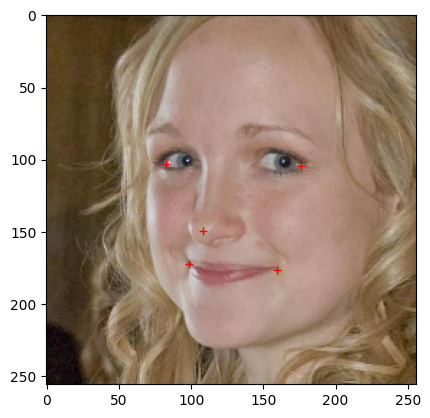

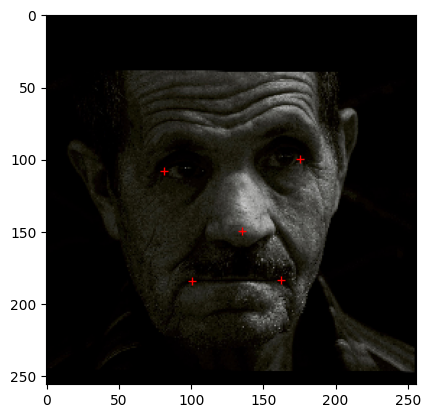

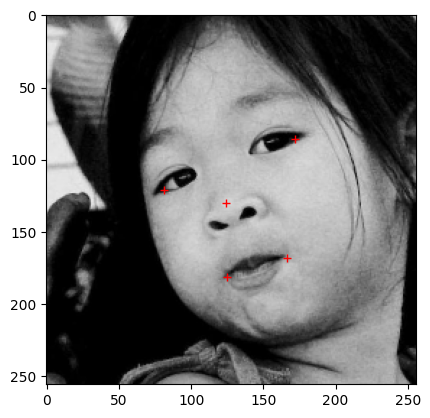

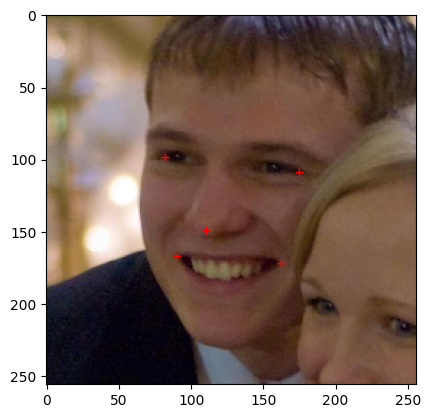

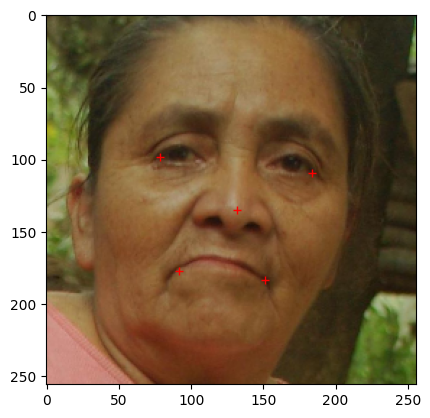

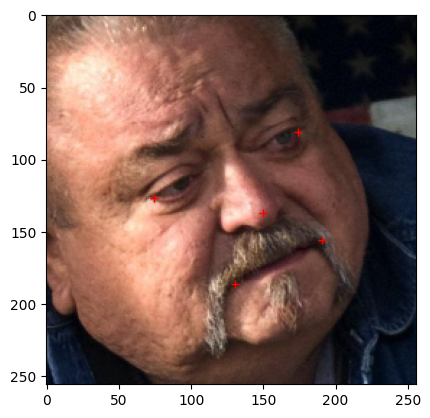

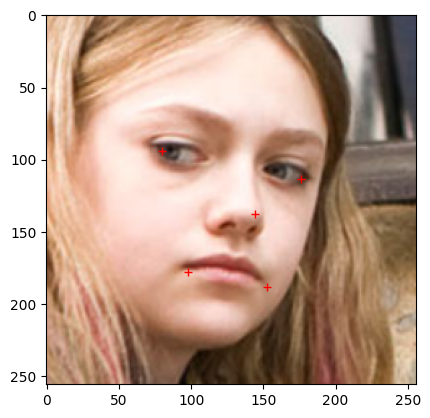

In [ ]:
import matplotlib.pyplot as plt

def visualise_pts(img, pts):
  plt.imshow(img)
  plt.plot(pts[:, 0], pts[:, 1], '+r')
  plt.show()

for i in range(8):
  idx = np.random.randint(0, train_img.shape[0])
  visualise_pts(train_img[idx,:], train_pts[idx,:])

## 2 Analysing the training Data

After visualising the data, it is clear that there are 5 points of that face that need to be considered:


1.   Left corner of left eye
2.   Right corner of right eye
3.   Middle peak of the nose
4.   Right corner of mouth
5.   Left corner of mouth

Additionally, the faces can be shown from many different angles. Some of the faces are face-on, while many other are looking down/up or to the side of the face. There is also a wide range of expression, from plain to angry. This can change the distance of facial feature from each other. For example, a surprised person might have their mouth open wide, pulling the corners of their mouth closer.

There is also some pictures with occlusion, some of this occlusion is relatively mild and the texture + shape of the feature is maintained, while others are completely obscured in shadow. Some of the people are also wearing hats and glasses, covering certain features and in the case of glasses, distorting the shape of the eyes. In addition, there are some photos with other objects covering parts of their faces, however this is often minor coverage and does not entirely cover any feature.

Due to many of the faces not directly facing the camera, some of the more extreme angles can hide the corners of the eyes and face, leading to the points being position more towards the middle of the feature.

There are also pictures with multiple faces, with some of these additional faces having their features being present in the photo as well. The training points indicate that there should only ever be 5 points, all of which on the 'main face'. By looking at the data, the 'main' face typically is the face closest to the centre and has ALL of their features shown in that image (some of the other faces in an image only have some shown (e.g. only left side of face shown).

Additionally, many of the photos (especially those at more extreme angles) have been cropped to fit the 256x256 image size. This cropped area is presented with colour (0,0,0) (black) and should be ignored as this just padding to make sure all photos are of the same shape.


## 3 Augmenting Data

The next step is to augment the data to create significantly more training data. Given the large amount of variability in angle, occlusion and colour, it is essential to artificially increase the number of training samples, to have a better trained model

### 3.1 Flipping Image

Flip the image in the X-axis and also moving the points to match. Not necessary to flip in y axis as no sampled picture appeared to have upside down faces

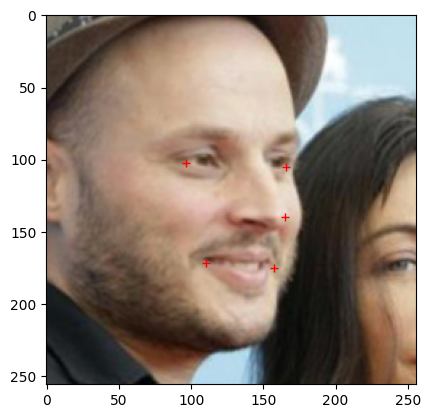

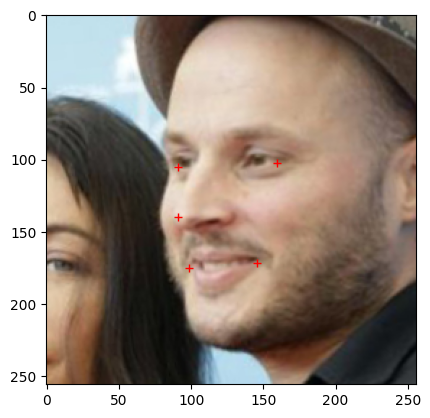

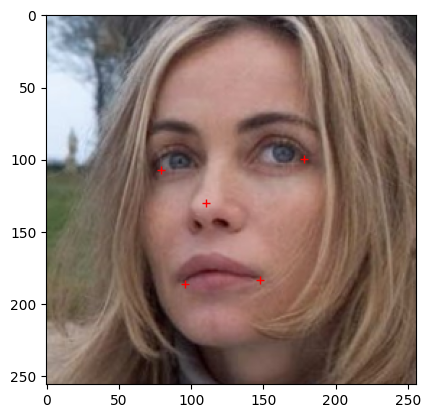

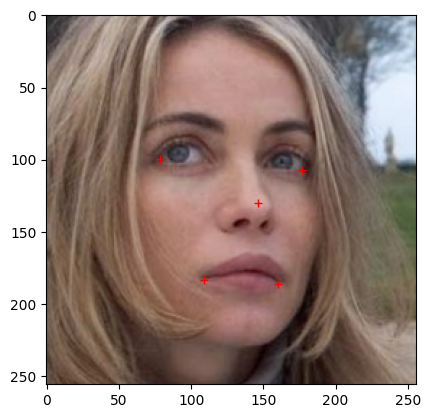

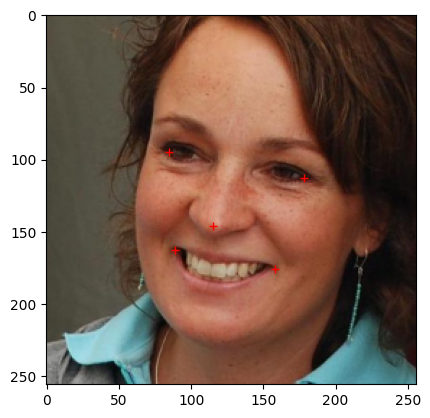

...

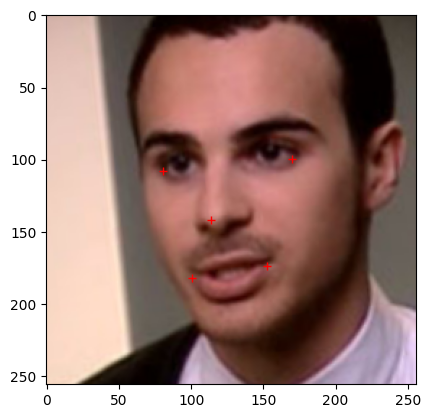

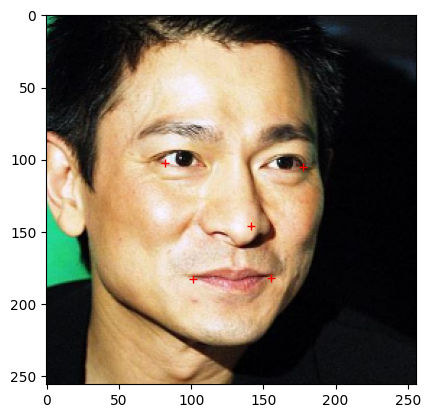

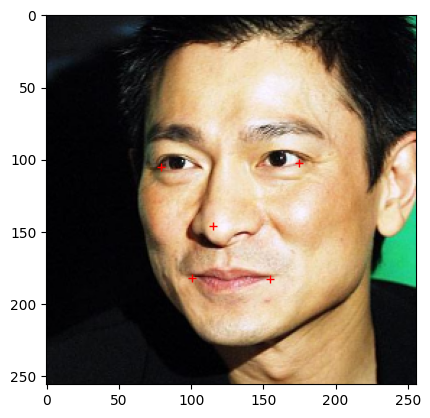

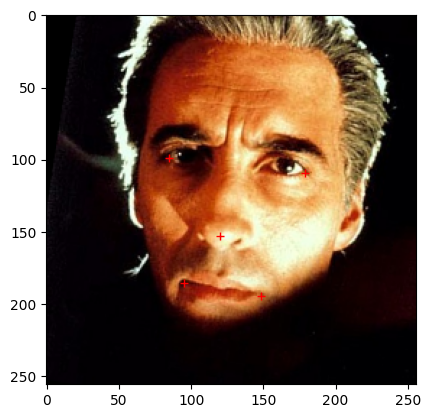

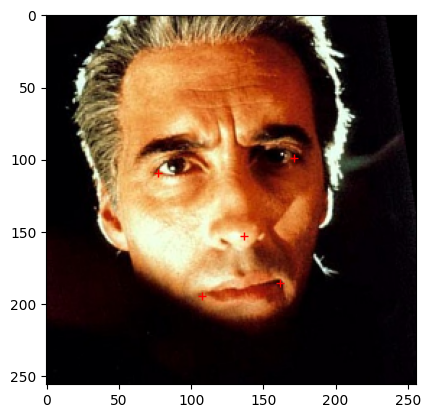

In [ ]:
import cv2

#Returns the entire original dataset flipped and its flipped points
def horizontalflipset(imgs,pts):
  flipped_imgs = imgs.copy()
  flipped_pts = pts.copy()
  #Flips each image
  for i in range(len(flipped_imgs)):
    flipped_imgs[i] = cv2.flip(flipped_imgs[i],1)
    pts_to_flip = flipped_pts[i]
    #Flips each point by reflecting on the x axis
    for j in range(len(pts_to_flip)):
      pts_to_flip[j,0] = 256 - pts_to_flip[j,0]
    flipped_pts[i] = pts_to_flip
  return flipped_imgs,flipped_pts

flipped_imgs, flipped_pts = horizontalflipset(train_img,train_pts)

for i in range(10):
  idx = np.random.randint(0,train_img.shape[0])
  visualise_pts(train_img[idx,:],train_pts[idx,:])
  visualise_pts(flipped_imgs[idx,:],flipped_pts[idx,:])

### 3.2 Rotating Image

Many of the faces in the data set are already skewed left or right, so doing marginal rotations (+/- 0-45 degrees) is inline with the current training set. Rotating the image too much may create data that differs drastically from the original dataset, this can lead to the model overfitting to the data.

Each photo will be rotated twice (within the range specified above) and added to the data set.

The code below creates

100%|██████████| 2810/2810 [00:09<00:00, 293.02it/s]


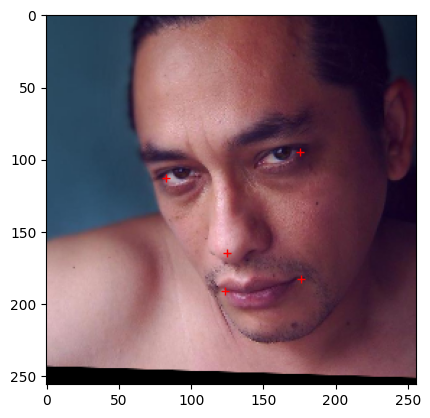

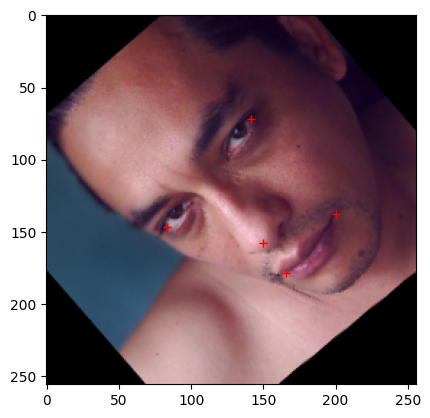

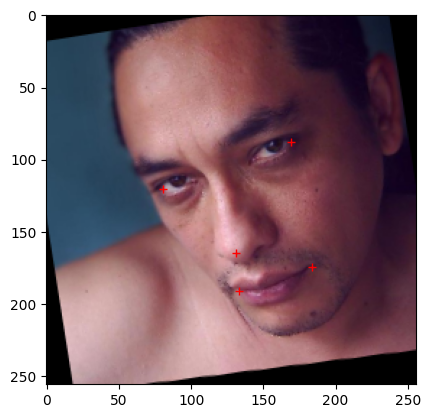

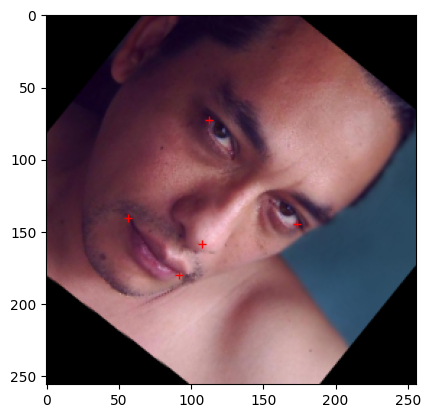

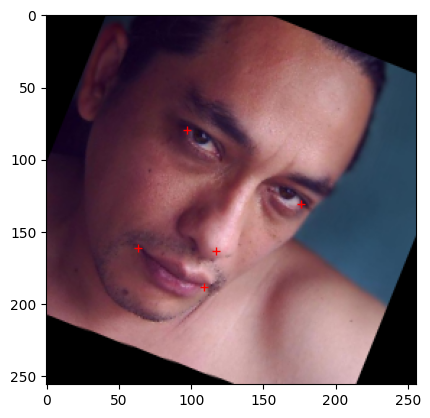

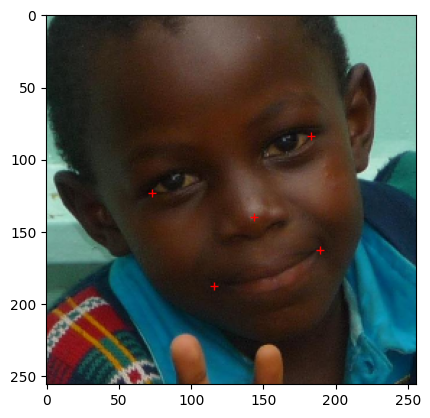

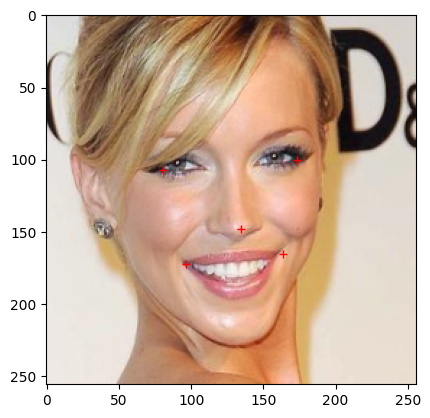

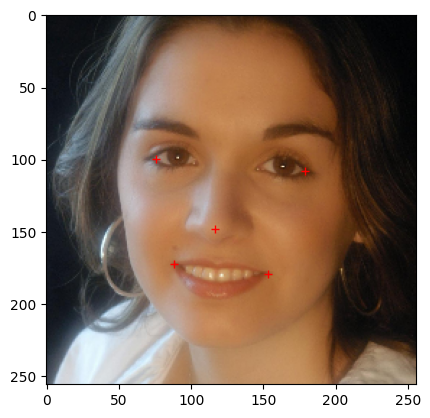

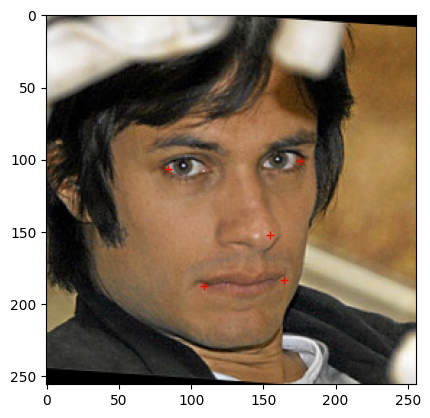

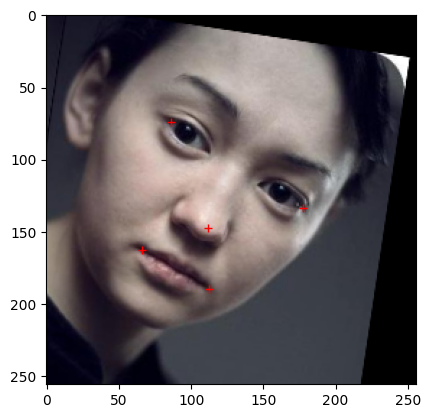

In [ ]:
import math
from tqdm import tqdm
#Takes origin and points as cartesian coordinates, and cos_angle = cos(angle), sin_angle = sin(angle)
#It gives the cosine and sine of the angle to reduce the computation, as these values will be the same for
#all points being rotated.
def rotate_point(origin, point, cos_angle,sin_angle):
    ox, oy = origin
    px, py = point
    x_diff = px - ox
    y_diff = py - oy

    new_x = ox + cos_angle * x_diff - sin_angle * y_diff
    new_y = oy + sin_angle * x_diff + cos_angle * y_diff
    return new_x, new_y

#Rotate just the image
def rotate(image, angle):
    image_center = (128,128)
    rot_mat = cv2.getRotationMatrix2D(image_center, angle, 1.0)
    result = cv2.warpAffine(image, rot_mat, image.shape[1::-1], flags=cv2.INTER_LINEAR)
    return result



#Returns rotated image and points
def rotate_img(img,pts):
  rotation = np.random.randint(-45,45)
  rotate_img = rotate(img,rotation)
  rotate_pts = pts.copy()
  cos_angle = cos_dict[-rotation]
  sin_angle = sin_dict[-rotation]
  for i in range(len(pts)):
     rotate_pts[i] = rotate_point([128,128],rotate_pts[i],cos_angle,sin_angle)
  return rotate_img,rotate_pts

#Creates a rotated set
def rotate_set(train_img,train_pts,flipped_imgs,flipped_pts):
  rotate_img_set = np.concatenate((train_img.copy(),train_img.copy(),train_img.copy(),train_img.copy(),train_img.copy(),train_img.copy()))
  rotate_pts_set = np.concatenate((train_pts.copy(),train_pts.copy(),train_pts.copy(),train_pts.copy(),train_pts.copy(),train_pts.copy()))
  for i in tqdm(range(5,14055,5)):
    img_1 = train_img[i//5].copy()
    img_2 = flipped_imgs[i//5].copy()
    pts_1 = train_pts[i//5].copy()
    pts_2 = flipped_pts[i//5].copy()
    rotate_img_set[i-5],rotate_pts_set[i-5] = img_1,pts_1
    rotate_img_set[i-4],rotate_pts_set[i-4] = rotate_img(img_1,pts_1)
    rotate_img_set[i-3],rotate_pts_set[i-3] = rotate_img(img_1,pts_1)
    rotate_img_set[i-2],rotate_pts_set[i-2] = rotate_img(img_2,pts_2)
    rotate_img_set[i-1],rotate_pts_set[i-1] = rotate_img(img_2,pts_2)
  return rotate_img_set,rotate_pts_set

value_ranges = list(range(-45,46))
cos_dict = {i:math.cos(math.radians(i)) for i in value_ranges}
sin_dict = {i:math.sin(math.radians(i)) for i in value_ranges}
rotate_img_set,rotate_pts_set = rotate_set(train_img,train_pts,flipped_imgs,flipped_pts)
for i in range(2):
  idx = np.random.randint(0,rotate_img_set.shape[0])
  nearest_5 = 5 * idx//5
  visualise_pts(rotate_img_set[nearest_5,:],rotate_pts_set[nearest_5,:])
  visualise_pts(rotate_img_set[(nearest_5+1),:],rotate_pts_set[(nearest_5+1),:])
  visualise_pts(rotate_img_set[(nearest_5+2),:],rotate_pts_set[(nearest_5+2),:])
  visualise_pts(rotate_img_set[(nearest_5+3),:],rotate_pts_set[(nearest_5+3),:])
  visualise_pts(rotate_img_set[(nearest_5+4),:],rotate_pts_set[(nearest_5+4),:])



### 3.3 Changing brightness

The dataset has faces that appear in harsh light and low light conditions, to make sure the model performs well on these conditions, 20% of the existing images in 'transformed_data' will have the brightness tweaked (+/- 80-120) and added to the data set

In [ ]:
#Increase brightness by adding/minusing the same value to all colour channels
def change_brightness(img,pts):
  coinflip = np.random.random()
  if coinflip > 0.5:
    brightness = np.random.randint(70,120)
  else:
    brightness = np.random.randint(-120,-70)
  contrast = 1
  img2 = cv2.addWeighted(img, contrast, np.zeros(img.shape, img.dtype), 0, brightness)
  return img2,pts

#Increase brightness to 2511 random images and add it to the end of the image set
def brightness_set(rotate_img_set,rotate_pts_set):
  size = rotate_img_set.shape[0]
  for i in range(2511):
    random_img = np.random.randint(0,size)
    rotate_img_set[14055+i],rotate_pts_set[14055+i] = change_brightness(rotate_img_set[random_img,:],rotate_pts_set[random_img,:])


brightness_set(rotate_img_set,rotate_pts_set)
final_imgs = rotate_img_set
final_pts = rotate_pts_set
train_test_split = int(np.round(final_imgs.shape[0]*0.9))

#Saving the last 10% of these unprocessed images to visualise the held-back set later in Task 2 Notebook Pt. 3
#This will cause an error on other google accounts, as the filepath will not be valid for them
np.savez('/content/gdrive/MyDrive/Colab-Notebooks/AML-coursework/VISUALISE_VAL_SET',x_train=final_imgs[train_test_split:],y_train=final_pts[train_test_split:])


### 3.5 Checking final image set

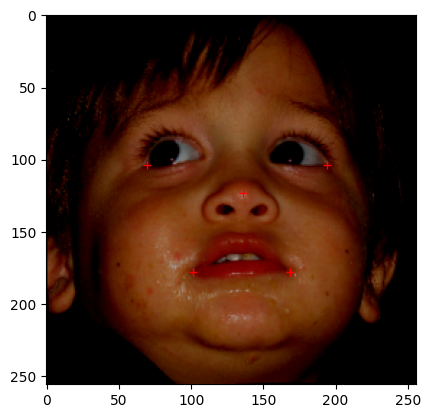

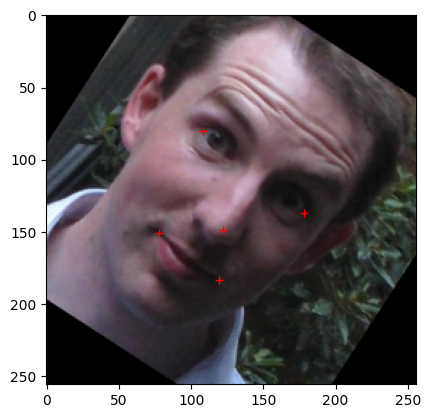

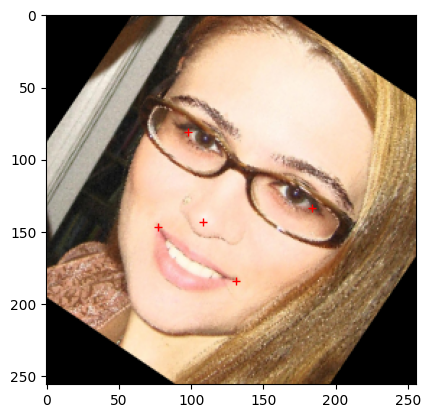

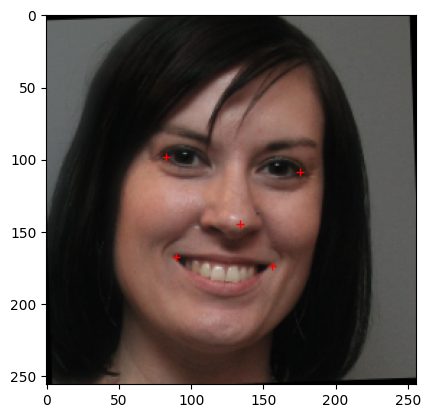

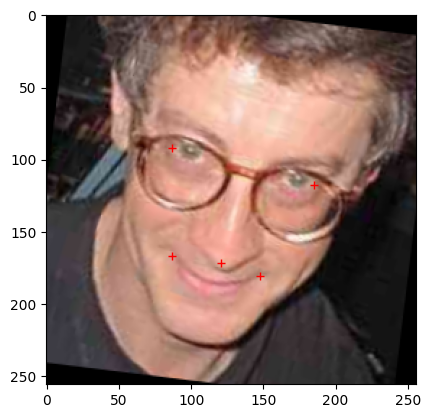

...

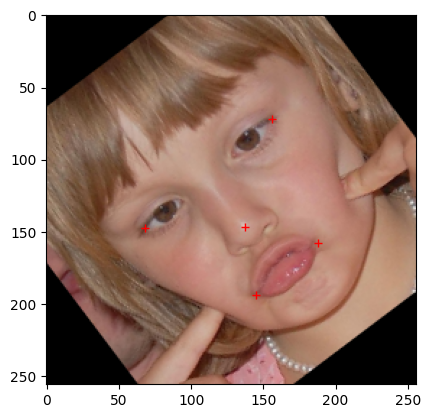

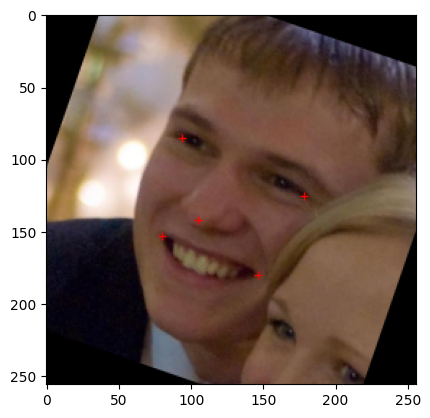

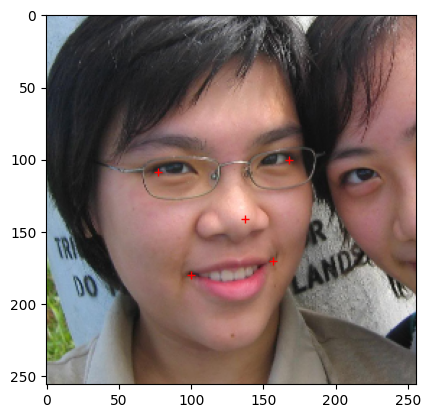

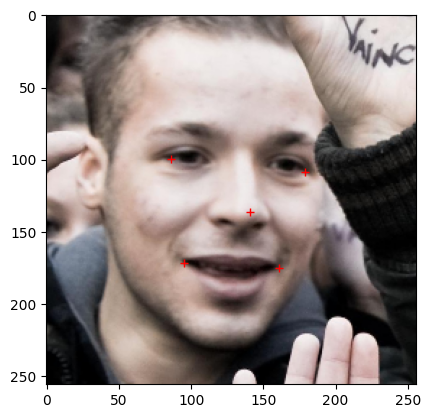

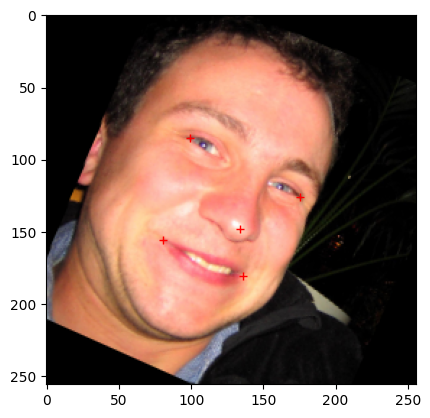

In [ ]:
for i in range(20):
  idx = np.random.randint(0,final_imgs.shape[0])
  visualise_pts(final_imgs[idx],final_pts[idx])

# 4 Preprocessing

Now that the data set has been inflated in size, the next step is to process the images to highlight features in the images. For the CNNs, there will be a few pre-processing steps, the images will be converted to grayscale, then histogram equalisation will be applied to increase contrast (aimed to aid against the very low light images), laplacian of gaussian then applied to detect edges, finally a crop to size 180x180 as this removes additional background will making sure all features are still present. The image pixel are then normalised

In [ ]:
import cv2
import gc
gc.collect()
def cropImg(img):
  h = 180
  w = 180
  centre = 128
  x = centre - w/2
  y = centre - h/2
  return img[int(y):int(y+h), int(x):int(x+w)]

pt_bias = (256 - 180)/2 #This moves the points to follow the cropped image, calculated as original size - new size

def preProcess(img,pts):

  #Turn image grey
  grey_img = np.uint8(cv2.cvtColor(img,cv2.COLOR_RGB2GRAY))

  #Equalise histogram to improve contrast and help extract features
  histogram_equalised = cv2.equalizeHist(grey_img)

  #Apply laplacian of gaussian
  laplacian_img = cv2.Laplacian(histogram_equalised,cv2.CV_64F)

  #Crop image
  cropped_img = cropImg(laplacian_img)
  pts = pts - pt_bias
  return (cropped_img/255), pts

def preprocessSet(imgset,ptsSet):
  output_set = np.zeros((16866,180,180))
  output_pts = ptsSet.copy()
  for i in tqdm(range(imgset.shape[0])):
    output_set[i],output_pts[i] = preProcess(imgset[i],ptsSet[i])
  return output_set,output_pts

process_img_set,process_pts_set = preprocessSet(final_imgs,final_pts)
print(process_img_set.shape,process_pts_set.shape)

#Save processed training data to google drive. This will cause an error on other google accounts, as the filepath will not be valid for them
np.savez('/content/gdrive/MyDrive/Colab-Notebooks/AML-coursework/PROCESSED_DATA_FINAL',x_train=process_img_set,y_train=process_pts_set)

100%|██████████| 16866/16866 [00:12<00:00, 1319.22it/s]


(16866, 180, 180) (16866, 5, 2)


## Please Switch to Notebook Task 2 Face Alignment Pt.2

This had to be done due to Google Colab running out of RAM when running all of the cells consecutively. The previous cell saved the processed data, meaning the other notebook simply has to open up the saved .npz file to continue. Part 2 contains the model creation and training while Part 3 will evaluate the models